In [1]:
# Load python modules
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix
from tensorflow.keras.layers import Resizing, Rescaling
import seaborn as sns
# import tensorflow_datasets as tfds
from sklearn.utils import shuffle 
import matplotlib.pyplot as plt
from datetime import datetime
import tensorflow as tf
from tqdm import tqdm  # Perform iterature with progress bar
import numpy as np
import cv2
import os

In [2]:
#Class labelsb
class_names = ['Glass', 'Metal', 'Organics', 'Paper', 'Plastic', 'Textile']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)
IMAGE_SIZE = (64, 64)

In [3]:
print('Number of classes:', nb_classes)

Number of classes: 6


In [4]:
class_names_label

{'Glass': 0, 'Metal': 1, 'Organics': 2, 'Paper': 3, 'Plastic': 4, 'Textile': 5}

In [5]:
resize_layer_32 = tf.keras.Sequential([
    Resizing(32, 32),
])

In [6]:
# Path to Dataset1e

# Dataset with 4 classes - 270 images for training and 50 images for testing per class
train_ds_1 = 'C:/Mani/Dataset/dataset1/train_ds'
test_ds_1 = 'C:/Mani/Dataset/dataset1/test_ds'

# Dataset with 4 classes - 450 images for training with data augmentation images and 50 images for testing
train_ds_2 = 'C:/Mani/Dataset/dataset2/train_ds'
test_ds_2 = 'C:/Mani/Dataset/dataset2/test_ds'

# Dataset with 6 classes - 450 images for training with data augmentation images and 50 images for testing
train_ds_3 = 'C:/Mani/Dataset/dataset3/train_ds'
test_ds_3 = 'C:/Mani/Dataset/dataset3/test_ds'



In [7]:
def load_data(train_path, test_path):
    """
        Load the data from local folder
        
    """
    datasets = [train_path, test_path]  
    
    output = []
    
    # Iterate through training and test sets
    for dataset in datasets:
        
        #Empty Image and Labels list
        images = []
        labels = []
        
        print("Loading {}".format(dataset))
        
        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]
            
            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):
                
                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                
                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE) 
                
                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)
                
        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')   
        
        output.append((images, labels))

    return output

In [8]:
#Prepare dataset for training and testing
(train_images, train_labels), (test_images, test_labels) = load_data(train_ds_3, test_ds_3)

Loading C:/Mani/Dataset/dataset3/train_ds


100%|███████████████████████████████████████████████████████████████████████████████| 450/450 [00:01<00:00, 225.28it/s]


Loading C:/Mani/Dataset/dataset3/test_ds


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 178.68it/s]


In [9]:
#Check the training and testing image shape
train_images.shape, test_images.shape

((2700, 64, 64, 3), (300, 64, 64, 3))

In [10]:
# Shuffle only the training dataset
np.random.seed(321)
train_images, train_labels = shuffle(train_images, train_labels)
test_images, test_labels = shuffle(test_images, test_labels)

In [11]:
#Check the number of training dataset
print('No of training images:', train_images.shape[0])

No of training images: 2700


In [12]:
#Normalise train and test image dataset from 0,255 to 0,1
train_images = train_images / 255.0 
test_images = test_images / 255.0

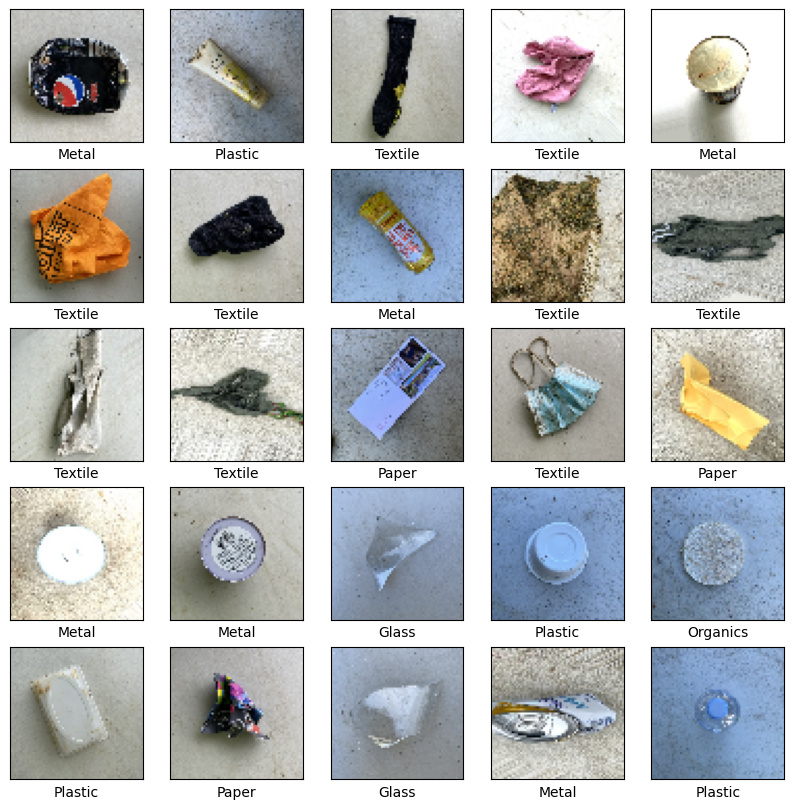

In [13]:
#Display 25 images 
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [14]:
#Sequential Model 1 with 2 Convolutional layers
# Model was built based on tf.keras.layers - with different type of layers as shown below:
#Conv2D, BatchNormalization, Maxpooling, Dropout, Dense, Flatten, resizing

model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Input((None,None,3)),
    resize_layer_32,
    
    # Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.05), activation = 'relu'),
    tf.keras.layers.Dense(64, activation = 'relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(6, activation='softmax')
       
])

model_1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 6)                   │             390 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 552,838 (2.11 MB)

 Trainable params: 552,646 (2.11 MB)

 Non-trainable params: 192 (768.00 B)

## CNN custom Models 

In [15]:
#Sequential Model 2 with 4 Convolutional layers
# Model was built based on tf.keras.layers - with different type of layers as shown below:
#Conv2D, BatchNormalization, Maxpooling, Dropout, Dense, Flatten, resizing

model_2 = tf.keras.models.Sequential([
    tf.keras.layers.Input((64,64,3)),
    
    #Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 3
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 4
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
       
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation = 'relu'),
    tf.keras.layers.Dense(32, activation = 'relu'),
    #tf.keras.layers.BatchNormalization(), 
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(6, activation='softmax')
       
])

model_2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 8, 8, 64)            │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 6)                   │             1

 Total params: 235,814 (921.15 KB)

 Trainable params: 235,366 (919.40 KB)

 Non-trainable params: 448 (1.75 KB)

In [16]:
#Sequential Model 3 with 5 Convolutional layers
# Model was built based on tf.keras.layers - with different type of layers as shown below:
#Conv2D, BatchNormalization, Maxpooling, Dropout, Dense, Flatten, resizing

model_3 = tf.keras.models.Sequential([
    tf.keras.layers.Input((64,64,3)),
    
    # Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 3
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(), 
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 4
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 5
    tf.keras.layers.Conv2D(64, (2,2), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(32, activation ='relu'),
    tf.keras.layers.Dense(16, activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(6, activation='softmax')      
])

model_3.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 8, 8, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 4, 4, 64)            │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 283,990 (1.08 MB)

 Trainable params: 283,254 (1.08 MB)

 Non-trainable params: 736 (2.88 KB)

## Model checkpoint path for model 1 to 3 to monitor validation accuracy

In [17]:
# Add callbacks to save the model weight with best validation accuracy during training

#import ModelCheckpoint package
#from tensorflow.keras.callbacks import ModelCheckpoint
# Source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

checkpoint_filepath6 = 'C:/Mani/ModelCheckpoint/model1_6.keras'
model_checkpoint_callback6 = ModelCheckpoint(
    filepath=checkpoint_filepath6,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)


checkpoint_filepath7 = 'C:/Mani/ModelCheckpoint/model2_6.keras'
model_checkpoint_callback7 = ModelCheckpoint(
    filepath=checkpoint_filepath7,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

checkpoint_filepath8 = 'C:/Mani/ModelCheckpoint/model3_6.keras'
model_checkpoint_callback8 = ModelCheckpoint(
    filepath=checkpoint_filepath8,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

## Compile model 1 to 3 with optimum learning rate.

In [18]:
model_1.compile(optimizer = tf.keras.optimizers.Adam(0.0015),
                loss = 'sparse_categorical_crossentropy', 
                metrics=['accuracy'])


model_2.compile(optimizer = tf.keras.optimizers.Adam(0.001),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])


model_3.compile(optimizer = tf.keras.optimizers.Adam(0.00098),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])
               

## Setup learning rate scheduler

In [19]:
#Learning rate scheduler for Model 1 and 2

def scheduler1(epoch, lr):
    if epoch <= 30:
        return lr
    else:
        return lr * 0.95
        
    
lr_callback1 = LearningRateScheduler(scheduler1, verbose=1)

In [20]:
#Learning rate scheduler for Model 3

def scheduler2(epoch, lr):
    if epoch <= 45:
        return lr
    else:
        return lr * 0.95
        
    
lr_callback2 = LearningRateScheduler(scheduler2, verbose=1)

## Define the number of epochs and batch size

In [21]:
# Set number of epochs
epochs = 150
batch_size = 64

## Model fitting with validation split 20%

In [22]:
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)

history1 = model_1.fit(train_images, train_labels,
                      batch_size=batch_size, epochs=epochs,
                      validation_split = 0.1, verbose=1,
                      callbacks=[lr_callback1, model_checkpoint_callback6])

# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_1_training_time', end_time - start_time)


Time model start: 2024-12-01 15:07:20.562276

Epoch 1: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.3259 - loss: 13.6678
Epoch 1: val_accuracy improved from -inf to 0.22222, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - accuracy: 0.3278 - loss: 13.5833 - val_accuracy: 0.2222 - val_loss: 5.8872 - learning_rate: 0.0015

Epoch 2: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 2/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5367 - loss: 4.4488
Epoch 2: val_accuracy did not improve from 0.22222
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - accuracy: 0.5374 - loss: 4.4303 - val_accuracy: 0.1815 - val_loss: 3.3715 - learning_rate: 0.0015

Epoch 3: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 3/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.6135 - loss: 2.4229
Epoch 3: val_accura

Epoch 19/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.8111 - loss: 1.4136
Epoch 19: val_accuracy improved from 0.40741 to 0.66296, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.8104 - loss: 1.4155 - val_accuracy: 0.6630 - val_loss: 1.8569 - learning_rate: 0.0015

Epoch 20: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 20/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7839 - loss: 1.5320
Epoch 20: val_accuracy did not improve from 0.66296
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7839 - loss: 1.5313 - val_accuracy: 0.4259 - val_loss: 3.3779 - learning_rate: 0.0015

Epoch 21: LearningRateScheduler setting learning rate to 0.001500000013038516.
Epoch 21/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.7728 - loss: 1.4419
Epoch 21: val_accuracy did not improve from 0.66296
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.7720 - loss: 1.4461 - val_acc


Epoch 38: LearningRateScheduler setting learning rate to 0.0010475058457814156.
Epoch 38/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.8759 - loss: 1.0785
Epoch 38: val_accuracy did not improve from 0.74074
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.8759 - loss: 1.0782 - val_accuracy: 0.5556 - val_loss: 2.0451 - learning_rate: 0.0010

Epoch 39: LearningRateScheduler setting learning rate to 0.0009951305866707117.
Epoch 39/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.8913 - loss: 1.0064
Epoch 39: val_accuracy did not improve from 0.74074
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.8912 - loss: 1.0062 - val_accuracy: 0.5852 - val_loss: 2.0413 - learning_rate: 9.9513e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0009453740960452705.
Epoch 40/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.9017 - loss: 0.9166
Epoch 40: val_accuracy did not improve from 0.74074
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.90

38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.9598 - loss: 0.4645 - val_accuracy: 0.7222 - val_loss: 1.0560 - learning_rate: 4.1608e-04

Epoch 57: LearningRateScheduler setting learning rate to 0.00039528009365312754.
Epoch 57/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9724 - loss: 0.4247
Epoch 57: val_accuracy improved from 0.82593 to 0.85185, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - accuracy: 0.9722 - loss: 0.4249 - val_accuracy: 0.8519 - val_loss: 0.7209 - learning_rate: 3.9528e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0003755161000299267.
Epoch 58/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.9712 - loss: 0.4193
Epoch 58: val_accuracy did not improve from 0.85185
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.9710 - loss: 0.4194 - val_accuracy: 0.8000 - val_loss: 0.9284 - learning_rate: 3.7552e-04

Epoch 59: LearningRateScheduler setting learning rate to 0.0003567


Epoch 75: LearningRateScheduler setting learning rate to 0.00015701091106166132.
Epoch 75/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9912 - loss: 0.2620
Epoch 75: val_accuracy did not improve from 0.88148
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.9911 - loss: 0.2621 - val_accuracy: 0.8556 - val_loss: 0.5746 - learning_rate: 1.5701e-04

Epoch 76: LearningRateScheduler setting learning rate to 0.00014916037034709006.
Epoch 76/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.9887 - loss: 0.2577
Epoch 76: val_accuracy did not improve from 0.88148
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.9887 - loss: 0.2576 - val_accuracy: 0.8630 - val_loss: 0.5691 - learning_rate: 1.4916e-04

Epoch 77: LearningRateScheduler setting learning rate to 0.00014170235735946334.
Epoch 77/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.9929 - loss: 0.2456
Epoch 77: val_accuracy improved from 0.88148 to 0.88889, saving model to C:/Mani/ModelCheckpoint/mode


Epoch 94: LearningRateScheduler setting learning rate to 5.924862780375406e-05.
Epoch 94/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.9938 - loss: 0.2062
Epoch 94: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.9938 - loss: 0.2062 - val_accuracy: 0.8778 - val_loss: 0.5039 - learning_rate: 5.9249e-05

Epoch 95: LearningRateScheduler setting learning rate to 5.628619710478233e-05.
Epoch 95/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.9933 - loss: 0.2055
Epoch 95: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.9934 - loss: 0.2053 - val_accuracy: 0.8630 - val_loss: 0.5281 - learning_rate: 5.6286e-05

Epoch 96: LearningRateScheduler setting learning rate to 5.3471887076739216e-05.
Epoch 96/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.9936 - loss: 0.2016
Epoch 96: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy:


Epoch 113: LearningRateScheduler setting learning rate to 2.2357684792950748e-05.
Epoch 113/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.9978 - loss: 0.1801
Epoch 113: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.9978 - loss: 0.1801 - val_accuracy: 0.8815 - val_loss: 0.5033 - learning_rate: 2.2358e-05

Epoch 114: LearningRateScheduler setting learning rate to 2.1239800207695226e-05.
Epoch 114/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.9981 - loss: 0.1793
Epoch 114: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.9980 - loss: 0.1793 - val_accuracy: 0.8704 - val_loss: 0.4976 - learning_rate: 2.1240e-05

Epoch 115: LearningRateScheduler setting learning rate to 2.017781080212444e-05.
Epoch 115/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.9969 - loss: 0.1781
Epoch 115: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step -


Epoch 132: LearningRateScheduler setting learning rate to 8.436753205387504e-06.
Epoch 132/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.9935 - loss: 0.1760
Epoch 132: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.9935 - loss: 0.1759 - val_accuracy: 0.8704 - val_loss: 0.4895 - learning_rate: 8.4368e-06

Epoch 133: LearningRateScheduler setting learning rate to 8.014915329113137e-06.
Epoch 133/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.9983 - loss: 0.1734
Epoch 133: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.9983 - loss: 0.1732 - val_accuracy: 0.8741 - val_loss: 0.4918 - learning_rate: 8.0149e-06

Epoch 134: LearningRateScheduler setting learning rate to 7.6141699082654665e-06.
Epoch 134/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.9958 - loss: 0.1736
Epoch 134: val_accuracy did not improve from 0.88889
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - 

Time model end: 2024-12-01 15:12:56.411434
Model_1_training_time 0:05:35.849158


In [23]:
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)


history2 = model_2.fit(train_images, train_labels,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.1, verbose=1,
                       callbacks=[lr_callback1, model_checkpoint_callback7])


# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_2_training_time', end_time - start_time)


Time model start: 2024-12-01 16:14:16.165766

Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - accuracy: 0.2751 - loss: 4.2972
Epoch 1: val_accuracy improved from -inf to 0.14815, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 14s 284ms/step - accuracy: 0.2768 - loss: 4.2864 - val_accuracy: 0.1481 - val_loss: 4.2585 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.4681 - loss: 3.3508
Epoch 2: val_accuracy did not improve from 0.14815
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - accuracy: 0.4687 - loss: 3.3478 - val_accuracy: 0.1481 - val_loss: 6.7884 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.5674 - loss: 2.9175
Epoch 3: va


Epoch 19: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 19/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.8711 - loss: 0.7759
Epoch 19: val_accuracy did not improve from 0.62222
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - accuracy: 0.8708 - loss: 0.7765 - val_accuracy: 0.5296 - val_loss: 1.9147 - learning_rate: 0.0010

Epoch 20: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 20/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.8626 - loss: 0.7873
Epoch 20: val_accuracy improved from 0.62222 to 0.73333, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - accuracy: 0.8625 - loss: 0.7872 - val_accuracy: 0.7333 - val_loss: 1.0992 - learning_rate: 0.0010

Epoch 21: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 21/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.8802 - loss: 0.7238
Epoch 21: val_accuracy did not improve from 0


Epoch 38: LearningRateScheduler setting learning rate to 0.0006983372120885178.
Epoch 38/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.9471 - loss: 0.4841
Epoch 38: val_accuracy improved from 0.73333 to 0.74444, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9470 - loss: 0.4842 - val_accuracy: 0.7444 - val_loss: 1.1302 - learning_rate: 6.9834e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0006634203542489559.
Epoch 39/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9553 - loss: 0.4380
Epoch 39: val_accuracy did not improve from 0.74444
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9553 - loss: 0.4380 - val_accuracy: 0.5296 - val_loss: 3.1881 - learning_rate: 6.6342e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0006302493420662358.
Epoch 40/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.9659 - loss: 0.3967
Epoch 40: val_accuracy improved from 

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9828 - loss: 0.2518
Epoch 56: val_accuracy did not improve from 0.87037
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9828 - loss: 0.2518 - val_accuracy: 0.7593 - val_loss: 1.1785 - learning_rate: 2.7739e-04

Epoch 57: LearningRateScheduler setting learning rate to 0.0002635200624354184.
Epoch 57/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9855 - loss: 0.2384
Epoch 57: val_accuracy did not improve from 0.87037
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9855 - loss: 0.2384 - val_accuracy: 0.8481 - val_loss: 0.6852 - learning_rate: 2.6352e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0002503440482541919.
Epoch 58/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - accuracy: 0.9912 - loss: 0.2273
Epoch 58: val_accuracy improved from 0.87037 to 0.87407, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - accuracy: 0.9911 - loss: 0.2274 - v

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9906 - loss: 0.1704
Epoch 74: val_accuracy did not improve from 0.89630
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - accuracy: 0.9907 - loss: 0.1703 - val_accuracy: 0.8926 - val_loss: 0.5710 - learning_rate: 1.1018e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.00010467393149156123.
Epoch 75/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9921 - loss: 0.1663
Epoch 75: val_accuracy improved from 0.89630 to 0.90370, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 259ms/step - accuracy: 0.9922 - loss: 0.1662 - val_accuracy: 0.9037 - val_loss: 0.5139 - learning_rate: 1.0467e-04

Epoch 76: LearningRateScheduler setting learning rate to 9.944023768184706e-05.
Epoch 76/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.9967 - loss: 0.1569
Epoch 76: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - accuracy: 0.9967 - loss: 0.1570 - 


Epoch 93: LearningRateScheduler setting learning rate to 4.1577981755835934e-05.
Epoch 93/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.9942 - loss: 0.1395
Epoch 93: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - accuracy: 0.9943 - loss: 0.1394 - val_accuracy: 0.8963 - val_loss: 0.5054 - learning_rate: 4.1578e-05

Epoch 94: LearningRateScheduler setting learning rate to 3.949908405047608e-05.
Epoch 94/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9986 - loss: 0.1330
Epoch 94: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 267ms/step - accuracy: 0.9986 - loss: 0.1331 - val_accuracy: 0.9037 - val_loss: 0.4798 - learning_rate: 3.9499e-05

Epoch 95: LearningRateScheduler setting learning rate to 3.752413140318822e-05.
Epoch 95/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - accuracy: 0.9962 - loss: 0.1360
Epoch 95: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - 


Epoch 112: LearningRateScheduler setting learning rate to 1.568960378790507e-05.
Epoch 112/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9900 - loss: 0.1342
Epoch 112: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - accuracy: 0.9901 - loss: 0.1341 - val_accuracy: 0.8815 - val_loss: 0.4980 - learning_rate: 1.5690e-05

Epoch 113: LearningRateScheduler setting learning rate to 1.490512377131381e-05.
Epoch 113/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9963 - loss: 0.1273
Epoch 113: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9963 - loss: 0.1273 - val_accuracy: 0.8926 - val_loss: 0.4804 - learning_rate: 1.4905e-05

Epoch 114: LearningRateScheduler setting learning rate to 1.4159867669150115e-05.
Epoch 114/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9963 - loss: 0.1270
Epoch 114: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 257m


Epoch 131: LearningRateScheduler setting learning rate to 5.920527905800554e-06.
Epoch 131/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.9979 - loss: 0.1223
Epoch 131: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 256ms/step - accuracy: 0.9979 - loss: 0.1224 - val_accuracy: 0.9037 - val_loss: 0.4764 - learning_rate: 5.9205e-06

Epoch 132: LearningRateScheduler setting learning rate to 5.624501704915019e-06.
Epoch 132/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - accuracy: 0.9968 - loss: 0.1206
Epoch 132: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 259ms/step - accuracy: 0.9968 - loss: 0.1207 - val_accuracy: 0.9074 - val_loss: 0.4755 - learning_rate: 5.6245e-06

Epoch 133: LearningRateScheduler setting learning rate to 5.343276598068769e-06.
Epoch 133/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.9979 - loss: 0.1188
Epoch 133: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms


Epoch 150: LearningRateScheduler setting learning rate to 2.2341329326991397e-06.
Epoch 150/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9965 - loss: 0.1220
Epoch 150: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - accuracy: 0.9965 - loss: 0.1219 - val_accuracy: 0.9074 - val_loss: 0.4621 - learning_rate: 2.2341e-06
Time model end: 2024-12-01 16:39:05.347263
Model_2_training_time 0:24:49.181497


In [24]:
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)

history3 = model_3.fit(train_images, train_labels,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.1, verbose=1,
                       callbacks=[lr_callback2, model_checkpoint_callback8])


# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_3_training_time', end_time - start_time )

Time model start: 2024-12-01 16:39:05.357004

Epoch 1: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.2253 - loss: 18.7160
Epoch 1: val_accuracy improved from -inf to 0.13333, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 14s 275ms/step - accuracy: 0.2265 - loss: 18.6892 - val_accuracy: 0.1333 - val_loss: 15.5512 - learning_rate: 9.8000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 2/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.3930 - loss: 14.1948
Epoch 2: val_accuracy improved from 0.13333 to 0.17778, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - accuracy: 0.3934 - loss: 14.1686 - val_accuracy: 0.1778 - val_loss: 11.6834 - learning_rate: 9.8000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 3/150
38/38 ━━━━━━


Epoch 19: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 19/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.7076 - loss: 1.3668
Epoch 19: val_accuracy did not improve from 0.65926
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - accuracy: 0.7077 - loss: 1.3672 - val_accuracy: 0.5037 - val_loss: 1.8345 - learning_rate: 9.8000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 20/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.7263 - loss: 1.3076
Epoch 20: val_accuracy did not improve from 0.65926
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - accuracy: 0.7261 - loss: 1.3081 - val_accuracy: 0.6074 - val_loss: 1.5354 - learning_rate: 9.8000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 21/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.7307 - loss: 1.3398
Epoch 21: val_accuracy did not improve from 0.65926
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - a


Epoch 38: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 38/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.7531 - loss: 1.3752
Epoch 38: val_accuracy did not improve from 0.65926
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 269ms/step - accuracy: 0.7531 - loss: 1.3750 - val_accuracy: 0.4296 - val_loss: 2.5319 - learning_rate: 9.8000e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 39/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.7650 - loss: 1.3023
Epoch 39: val_accuracy did not improve from 0.65926
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - accuracy: 0.7649 - loss: 1.3019 - val_accuracy: 0.4074 - val_loss: 2.1321 - learning_rate: 9.8000e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 40/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.7870 - loss: 1.2260
Epoch 40: val_accuracy did not improve from 0.65926
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - a


Epoch 57: LearningRateScheduler setting learning rate to 0.000557424098951742.
Epoch 57/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.8711 - loss: 0.9087
Epoch 57: val_accuracy did not improve from 0.67407
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - accuracy: 0.8709 - loss: 0.9089 - val_accuracy: 0.5556 - val_loss: 1.8545 - learning_rate: 5.5742e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0005295528884744271.
Epoch 58/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.8509 - loss: 0.9229
Epoch 58: val_accuracy improved from 0.67407 to 0.71481, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - accuracy: 0.8504 - loss: 0.9237 - val_accuracy: 0.7148 - val_loss: 1.2634 - learning_rate: 5.2955e-04

Epoch 59: LearningRateScheduler setting learning rate to 0.0005030752246966585.
Epoch 59/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.8463 - loss: 0.9562
Epoch 59: val_accuracy improved from 0

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.9473 - loss: 0.5505
Epoch 75: val_accuracy did not improve from 0.85185
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - accuracy: 0.9470 - loss: 0.5508 - val_accuracy: 0.8407 - val_loss: 0.7896 - learning_rate: 2.2142e-04

Epoch 76: LearningRateScheduler setting learning rate to 0.00021034593737567775.
Epoch 76/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.9402 - loss: 0.5556
Epoch 76: val_accuracy did not improve from 0.85185
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - accuracy: 0.9403 - loss: 0.5555 - val_accuracy: 0.8519 - val_loss: 0.7848 - learning_rate: 2.1035e-04

Epoch 77: LearningRateScheduler setting learning rate to 0.00019982864396297372.
Epoch 77/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.9352 - loss: 0.5404
Epoch 77: val_accuracy did not improve from 0.85185
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - accuracy: 0.9351 - loss: 0.5404 - val_accuracy: 0.7815 - val_loss: 0.9693 - learning_rate: 1.


Epoch 94: LearningRateScheduler setting learning rate to 8.355241734534501e-05.
Epoch 94/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9743 - loss: 0.3496
Epoch 94: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - accuracy: 0.9742 - loss: 0.3497 - val_accuracy: 0.8407 - val_loss: 0.7203 - learning_rate: 8.3552e-05

Epoch 95: LearningRateScheduler setting learning rate to 7.937479786050972e-05.
Epoch 95/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.9782 - loss: 0.3370
Epoch 95: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - accuracy: 0.9782 - loss: 0.3370 - val_accuracy: 0.8593 - val_loss: 0.6768 - learning_rate: 7.9375e-05

Epoch 96: LearningRateScheduler setting learning rate to 7.540605693066026e-05.
Epoch 96/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.9755 - loss: 0.3308
Epoch 96: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - a


Epoch 113: LearningRateScheduler setting learning rate to 3.1528807448921724e-05.
Epoch 113/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9925 - loss: 0.2436
Epoch 113: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - accuracy: 0.9925 - loss: 0.2435 - val_accuracy: 0.8926 - val_loss: 0.5251 - learning_rate: 3.1529e-05

Epoch 114: LearningRateScheduler setting learning rate to 2.9952368458907584e-05.
Epoch 114/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - accuracy: 0.9927 - loss: 0.2417
Epoch 114: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 284ms/step - accuracy: 0.9927 - loss: 0.2417 - val_accuracy: 0.8815 - val_loss: 0.5020 - learning_rate: 2.9952e-05

Epoch 115: LearningRateScheduler setting learning rate to 2.8454750554374184e-05.
Epoch 115/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9947 - loss: 0.2428
Epoch 115: val_accuracy did not improve from 0.90370
38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 27

38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 270ms/step - accuracy: 0.9962 - loss: 0.2112 - val_accuracy: 0.8963 - val_loss: 0.4756 - learning_rate: 1.2524e-05

Epoch 132: LearningRateScheduler setting learning rate to 1.1897510012204293e-05.
Epoch 132/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9952 - loss: 0.2088
Epoch 132: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - accuracy: 0.9952 - loss: 0.2089 - val_accuracy: 0.8889 - val_loss: 0.4723 - learning_rate: 1.1898e-05

Epoch 133: LearningRateScheduler setting learning rate to 1.1302634857202064e-05.
Epoch 133/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.9908 - loss: 0.2198
Epoch 133: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - accuracy: 0.9909 - loss: 0.2198 - val_accuracy: 0.9037 - val_loss: 0.4728 - learning_rate: 1.1303e-05

Epoch 134: LearningRateScheduler setting learning rate to 1.0737502725532977e-05.
Epoch 134/150
38/38 ━━━━━━━━━

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9937 - loss: 0.2037
Epoch 150: val_accuracy did not improve from 0.91481
38/38 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - accuracy: 0.9936 - loss: 0.2037 - val_accuracy: 0.8963 - val_loss: 0.4636 - learning_rate: 4.7259e-06
Time model end: 2024-12-01 17:04:50.064580
Model_3_training_time 0:25:44.707576


## Plot accuracy and loss against epochs during training and validation

Text(0.5, 1.0, 'Model 1 Accuracy (Exp:6.3)')

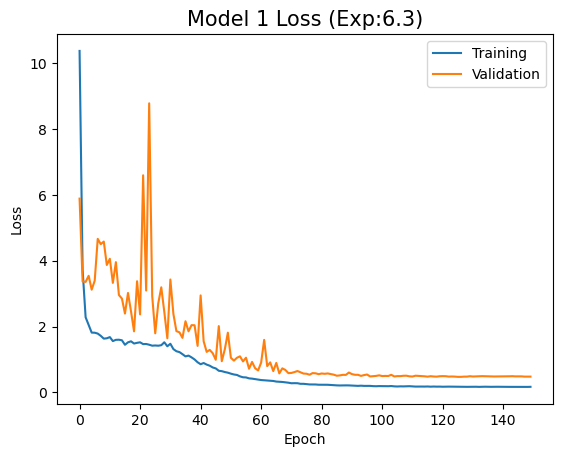

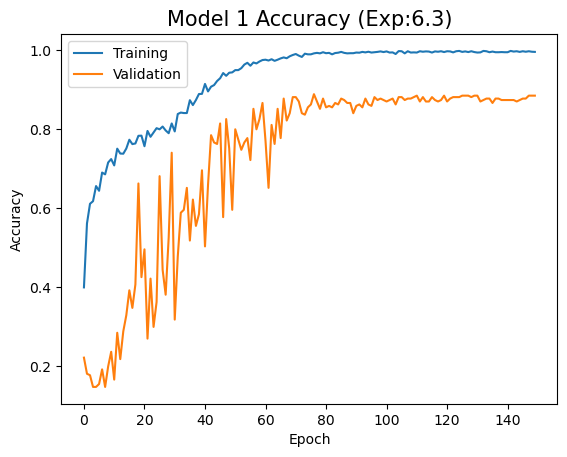

In [25]:

#Plot the training and validation loss
plt.figure()
plt.plot(history1.history['loss'], label='Training')
plt.plot(history1.history['val_loss'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model 1 Loss (Exp:6.3)', fontsize = 15)

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history1.history['accuracy'], label='Training')
plt.plot(history1.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model 1 Accuracy (Exp:6.3)', fontsize = 15)


Text(0.5, 1.0, 'Model 2 Accuracy (Exp:6.3)')

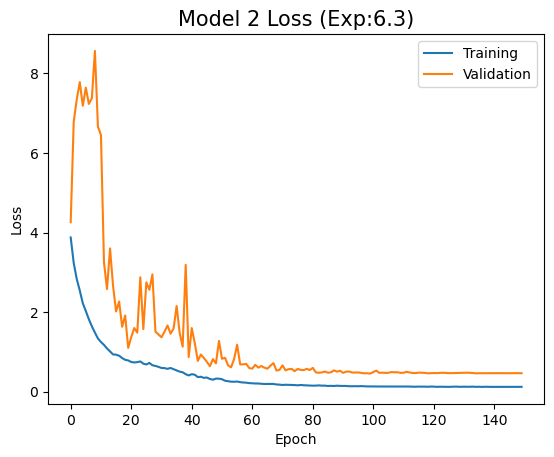

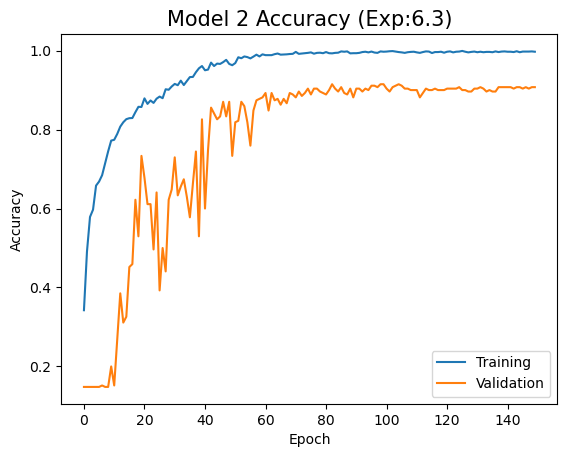

In [26]:
#Plot the training and validation loss
plt.figure()
plt.plot(history2.history['loss'], label='Training')
plt.plot(history2.history['val_loss'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model 2 Loss (Exp:6.3)', fontsize = 15)

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history2.history['accuracy'], label='Training')
plt.plot(history2.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model 2 Accuracy (Exp:6.3)', fontsize = 15)

Text(0.5, 1.0, 'Model 3 Accuracy (Exp:6.3)')

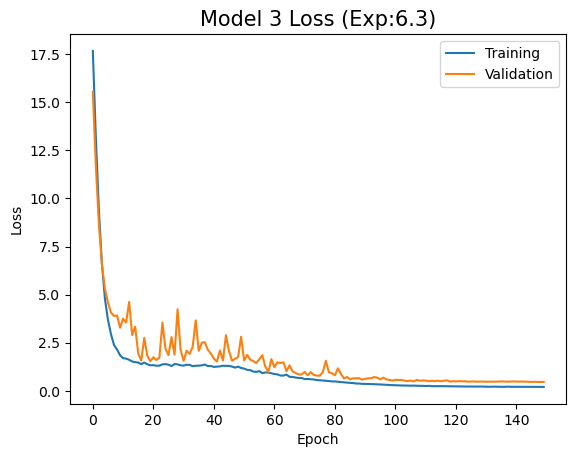

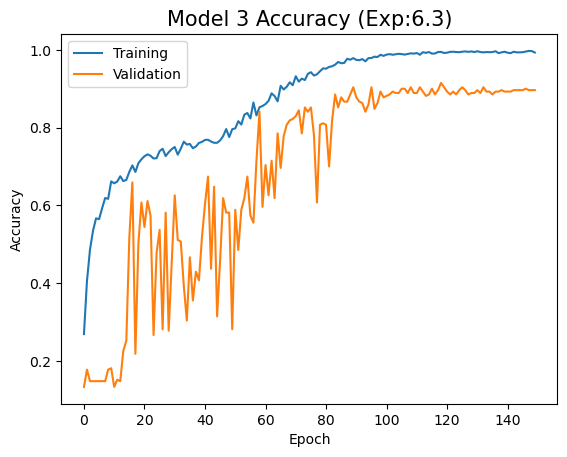

In [27]:
#Plot the training and validation loss
plt.figure()
plt.plot(history3.history['loss'], label='Training')
plt.plot(history3.history['val_loss'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model 3 Loss (Exp:6.3)', fontsize = 15)

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history3.history['accuracy'], label='Training')
plt.plot(history3.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Model 3 Accuracy (Exp:6.3)', fontsize = 15)

## Evaluate the model for test images

In [28]:
# Evaluate the test result for model 1, 2, 3
model_1.load_weights(checkpoint_filepath6)
Test_result1 = model_1.evaluate(test_images, test_labels, batch_size = 64)

model_2.load_weights(checkpoint_filepath7)
Test_result2 = model_2.evaluate(test_images, test_labels, batch_size = 64)

model_3.load_weights(checkpoint_filepath8)
Test_result3 = model_3.evaluate(test_images, test_labels, batch_size = 64)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8656 - loss: 0.5290
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.9340 - loss: 0.4563
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.9040 - loss: 0.4849


## Confusion matrix for model 1 to 3

In [29]:
predictions1 = model_1.predict(test_images)     # Vector of probabilities
pred_label1 = np.argmax(predictions1, axis = 1) # We take the highest probability


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


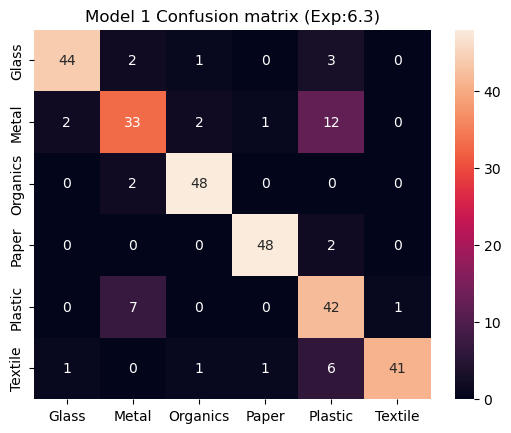

In [30]:
CM1 = confusion_matrix(test_labels, pred_label1)
ax = plt.axes()
sns.heatmap(CM1, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Model 1 Confusion matrix (Exp:6.3)')
plt.show()

In [31]:
#Obtain the model's prediction for the test_images
predictions2 = model_2.predict(test_images)
pred_label2 = np.argmax(predictions2, axis = 1)



10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


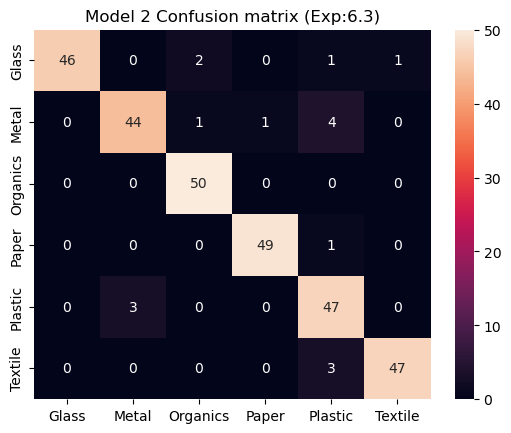

In [32]:
CM2 = confusion_matrix(test_labels, pred_label2)
ax = plt.axes()
sns.heatmap(CM2, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Model 2 Confusion matrix (Exp:6.3)')
plt.show()

In [33]:
#Obtain the model's prediction for the test_images
predictions3 = model_3.predict(test_images)
pred_label3 = np.argmax(predictions3, axis = 1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step


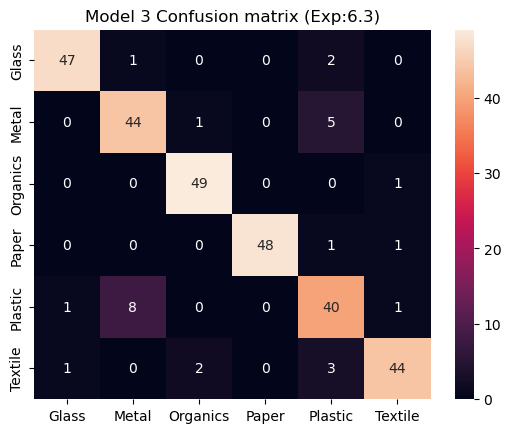

In [34]:
CM3 = confusion_matrix(test_labels, pred_label3)
ax = plt.axes()
sns.heatmap(CM3, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Model 3 Confusion matrix (Exp:6.3)')
plt.show()

## Display 25 images for each model with actual and predicted label

25 random image with actual and predicted label for Model 1


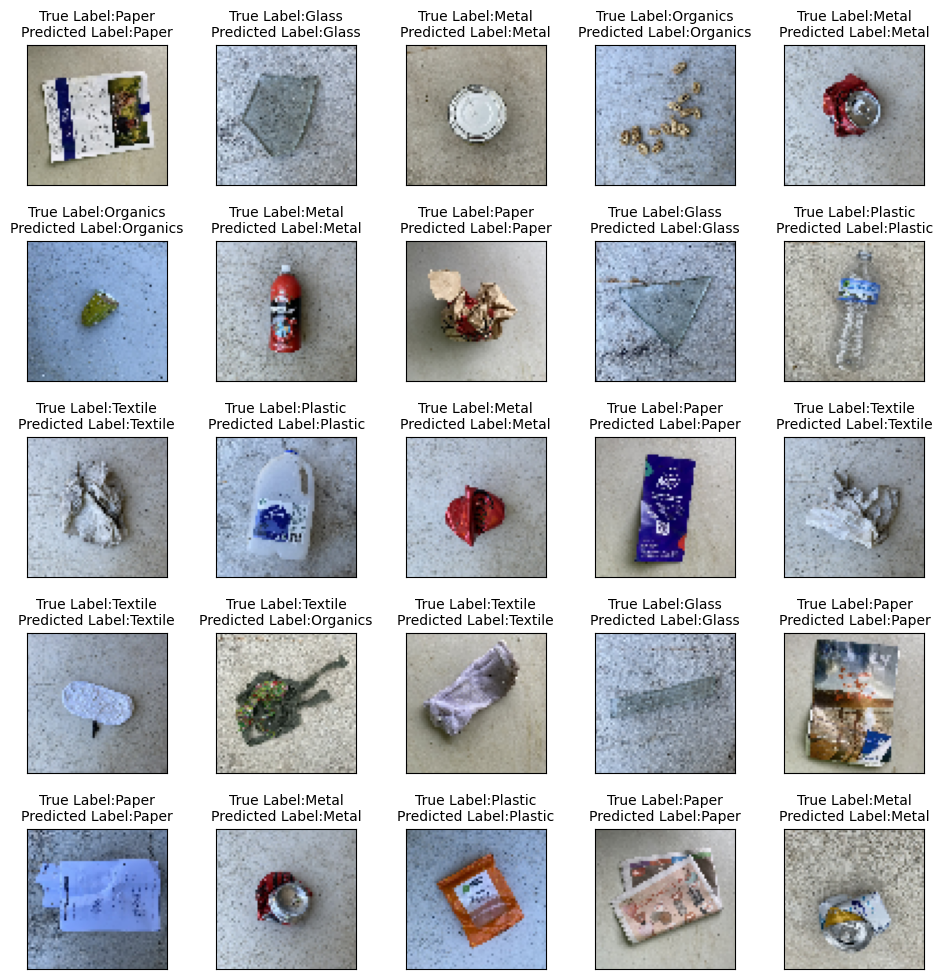

In [35]:
#Display actual and predicted labels for 25 images from model 1
print('25 random image with actual and predicted label for Model 1')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + class_names[pred_label1[i]], fontsize = 10)
    
    
    #plt.show()

25 random image with actual and predicted label for Model 2


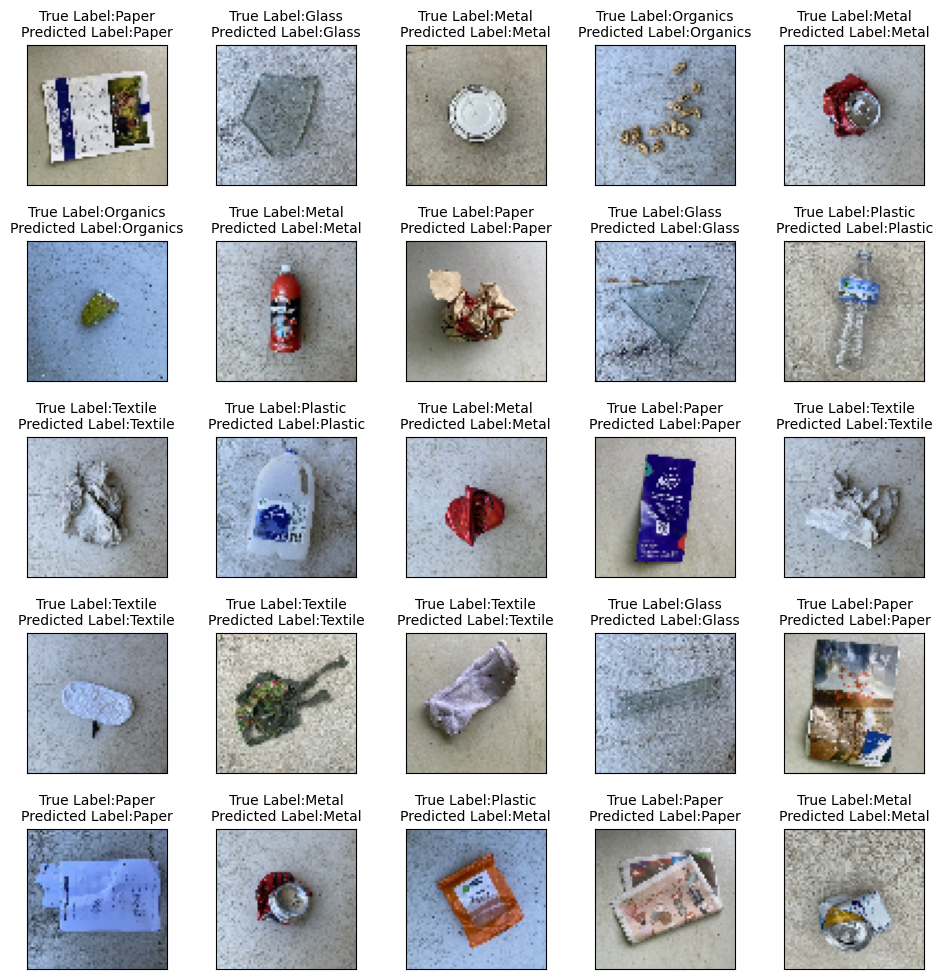

In [36]:
#Display actual and predicted labels for 25 images from Model 2
print('25 random image with actual and predicted label for Model 2')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + class_names[pred_label2[i]], fontsize = 10)
    

25 random image with actual and predicted label for Model 3


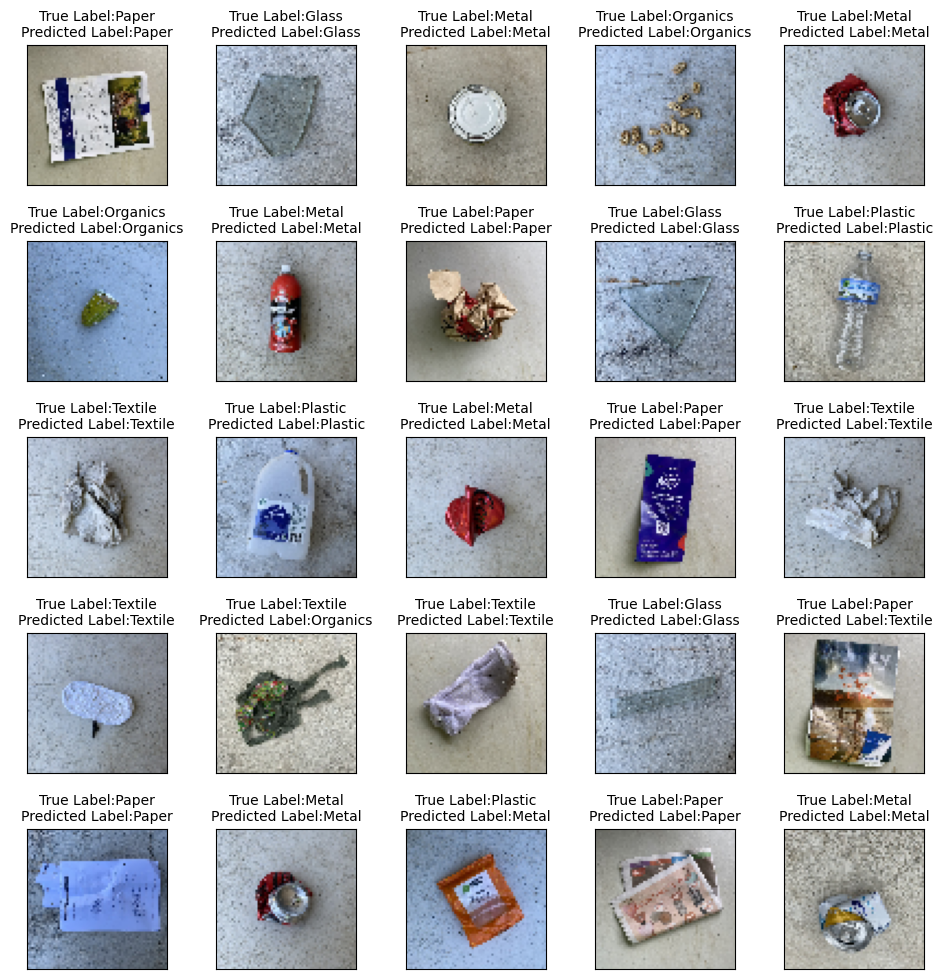

In [37]:
#Display actual and predicted labels for 25 images from model 3
print('25 random image with actual and predicted label for Model 3')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + class_names[pred_label3[i]], fontsize = 10)
    

## Display the misclassied image for model 1 to 3

In [45]:
def display_mislabel_images(class_names, images, labels):
    """
        Display mislabel images from the images array with its corresponding labels
    """
  
    fig = plt.figure(figsize=(15,15))
    #fig.suptitle("mislabeled images", fontsize=16)
    for i in range(28):
        plt.subplot(5,6,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i], cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[i]], fontsize = 15) 
    plt.show()

In [39]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
        Print all the mislabeled images by the classifier
    """
    correct_label = (test_labels == pred_labels)
    mislabeled_indices = np.where(correct_label == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
         
    display_mislabel_images(class_names,  mislabeled_images, mislabeled_labels)

Mislabel image for model 1


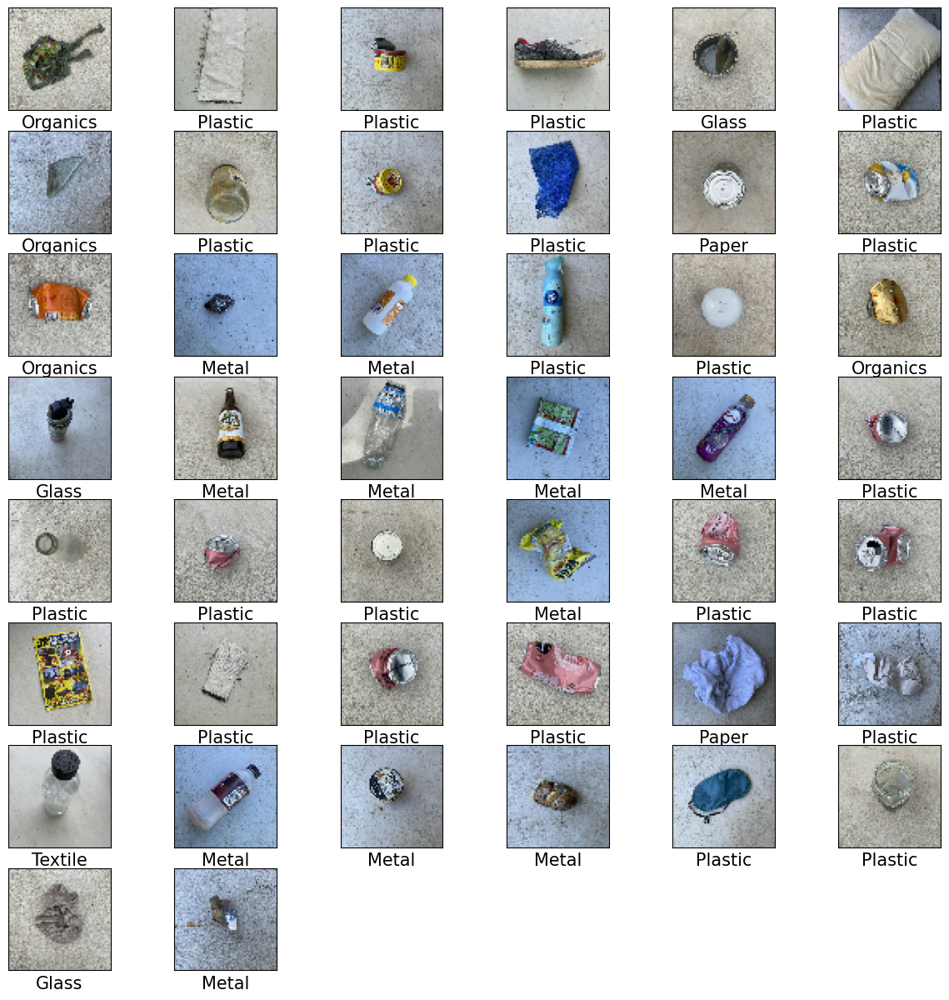

In [40]:
print('Mislabel image for model 1')
print_mislabeled_images(class_names, test_images, test_labels, pred_label1)

Mislabel image for model 2


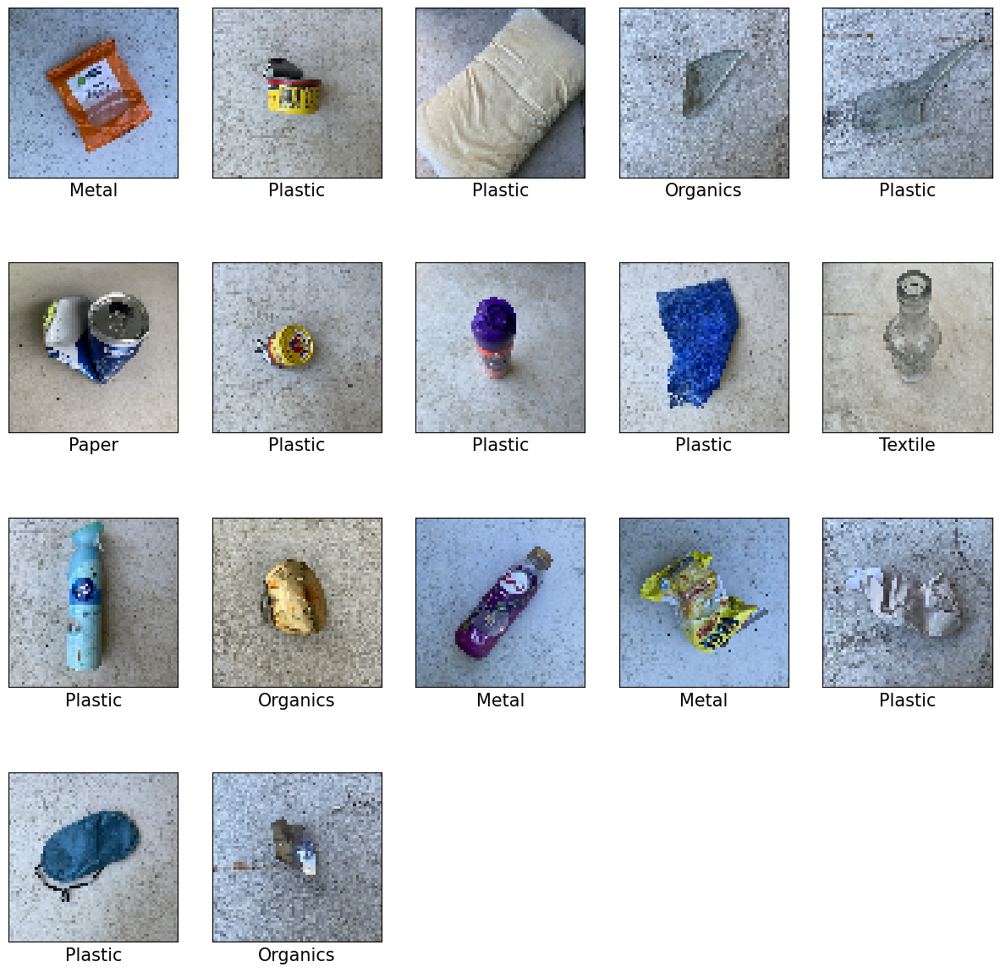

In [44]:
print('Mislabel image for model 2')
print_mislabeled_images(class_names, test_images, test_labels, pred_label2)

Mislabel image for model 3


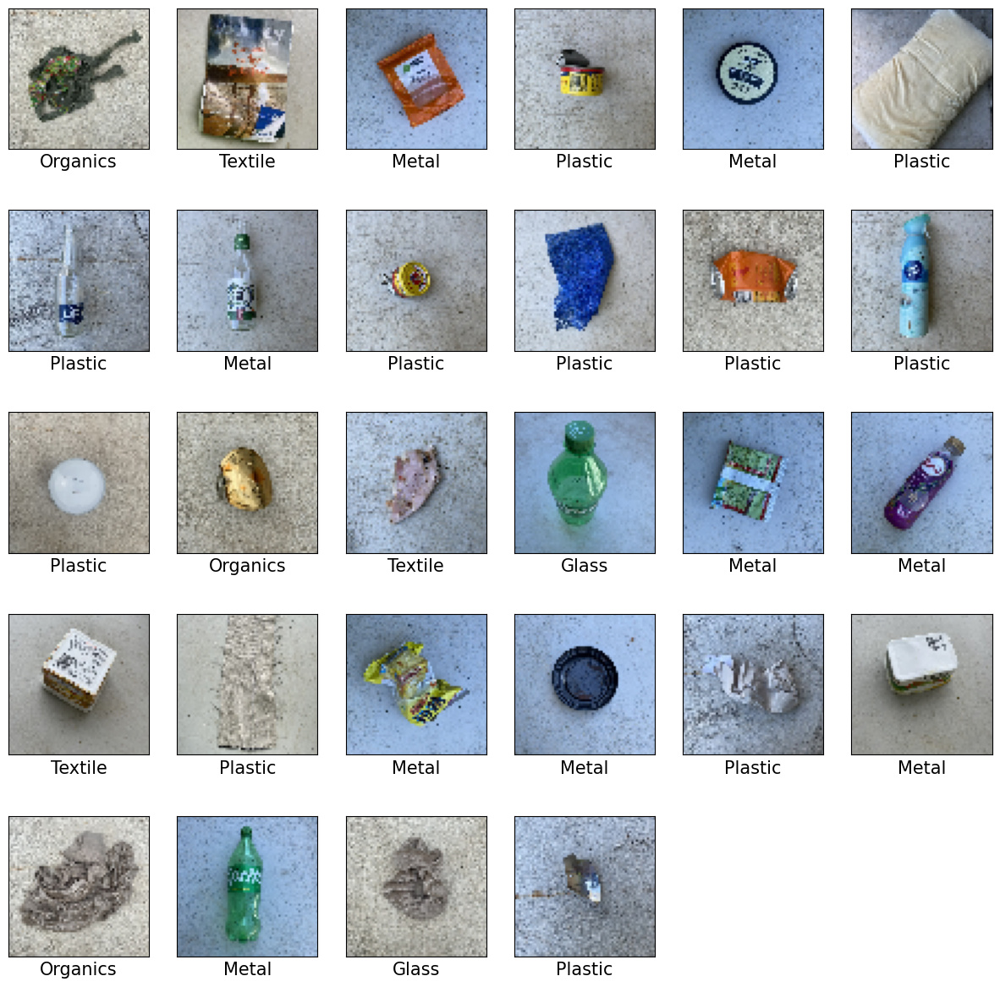

In [46]:
print('Mislabel image for model 3')
print_mislabeled_images(class_names, test_images, test_labels, pred_label3)

## Predict a single image

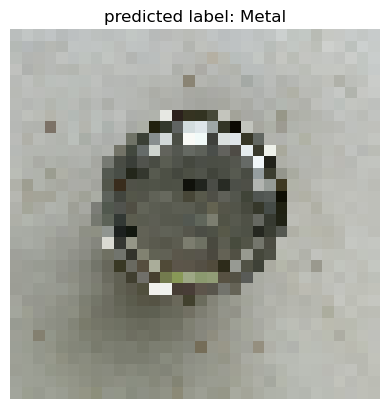

Model 1 Prediction time: 0:00:00.095729


In [73]:
start_time = datetime.now()
#print('Predict start:', start_time)

IMAGE_SIZE = (32, 32)
test_image1 = cv2.imread("C:/test_ds/Metal/Metal_6.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_1(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
#print('Predict end:', end_time)
print('Model 1 Prediction time:', end_time - start_time)

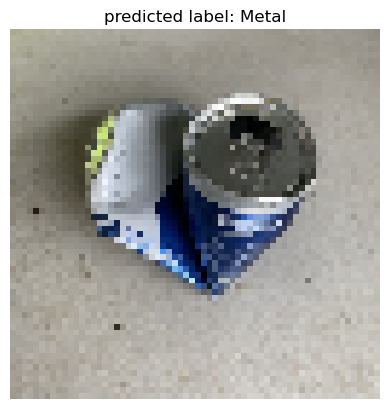

Model 2 Prediction time: 0:00:00.092710


In [74]:
start_time = datetime.now()
#print('Predict start:', start_time)

IMAGE_SIZE = (64, 64)
test_image1 = cv2.imread("C:/test_ds/Metal/Metal_2.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_2(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
#print('Predict end:', end_time)
print('Model 2 Prediction time:', end_time - start_time)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


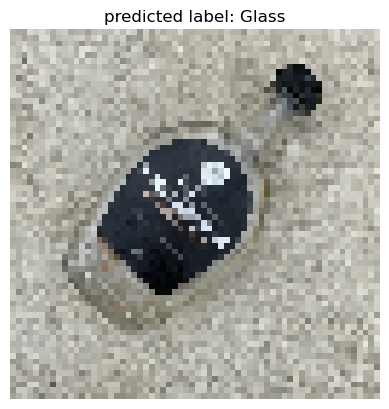

Prediction time: 0:00:00.134879


In [78]:
start_time = datetime.now()
#print('Predict start:', start_time)
IMAGE_SIZE = (64, 64)
test_image1 = cv2.imread("C:/test_ds/Glass/Glass_6.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_3.predict(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
#print('Predict end:', end_time)
print('Prediction time:', end_time - start_time);

## Pre-Training model - Transfer Learning

In [79]:
#Class labelsb
class_names = ['Glass', 'Metal', 'Organics', 'Paper', 'Plastic', 'Textile']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)
IMAGE_SIZE = (224, 224)

In [80]:
#Prepare dataset for training and testing for Resnet50
(train_images1, train_labels1), (test_images1, test_labels1) = load_data(train_ds_3, test_ds_3)


Loading C:/Mani/Dataset/dataset3/train_ds


100%|███████████████████████████████████████████████████████████████████████████████| 450/450 [00:01<00:00, 246.10it/s]


Loading C:/Mani/Dataset/dataset3/test_ds


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 170.25it/s]


In [81]:
# Shuffle only the training dataset
np.random.seed(321)
train_images1, train_labels1 = shuffle(train_images1, train_labels1)
test_images1, test_labels1 = shuffle(test_images1, test_labels1)

In [82]:
#Check the training and testing image shape - should 224 by 224 for Resnet50
train_images1.shape, test_images1.shape

((2700, 224, 224, 3), (300, 224, 224, 3))

In [83]:
#Normalise train and test image dataset from 0,255 to 0,1
#train_images_scaled = train_images / 255.0 
#test_images_scaled = test_images / 255.0

In [84]:
# Add callbacks to save the model weight with best accuracy during training
# import ModelCheckpoint package
# from tensorflow.keras.callbacks import ModelCheckpoint
# Source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

checkpoint_filepath9 = 'C:/Mani/ModelCheckpoint/model4_6.keras'
model_checkpoint_callback9 = ModelCheckpoint(
    filepath=checkpoint_filepath9,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)


checkpoint_filepath10 = 'C:/Mani/ModelCheckpoint/model5_6.keras'
model_checkpoint_callback10 = ModelCheckpoint(
    filepath=checkpoint_filepath10,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)



## Pre-Trained Model - EfficientNetV2L

In [85]:
#EfficientNet pre-trained model
base_model = tf.keras.applications.EfficientNetV2L(
    include_top=False,
    weights='imagenet',
    input_shape=((224,224,3)),
    )


In [86]:
base_model.trainable = False

In [87]:
# Build EfficientNetV2 model for waste classification

model_EfficientNetV2 = tf.keras.Sequential([
    tf.keras.layers.Input((224,224,3)),
    base_model,
    tf.keras.layers.Conv2D(32, (3,3),padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    #tf.keras.layers.Dense(1024, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(6, activation='softmax')      
])

model_EfficientNetV2.summary()    


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetv2-l (Functional)        │ (None, 7, 7, 1280)          │     117,746,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 7, 7, 32)            │         368,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 3, 3, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 3, 3, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 288)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 128)                 │          36,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 118,153,286 (450.72 MB)

 Trainable params: 406,438 (1.55 MB)

 Non-trainable params: 117,746,848 (449.17 MB)

In [88]:
#Compile Efficientnet model

base_learning_rate = 0.0003
model_EfficientNetV2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])



## Fit EfficientNet 

In [89]:
E_epochs = 35
# Get the current time
start_time = datetime.now()
print('Time model start:', start_time)

history4 = model_EfficientNetV2.fit(train_images1, train_labels1,
                       batch_size=batch_size, epochs= E_epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[model_checkpoint_callback9
                                 ])

# Get the current time
end_time = datetime.now()
print('Time model end:', end_time) 

Time model start: 2024-12-01 17:28:53.927560
Epoch 1/35
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.4109 - loss: 104.2371 
Epoch 1: val_accuracy improved from -inf to 0.81296, saving model to C:/Mani/ModelCheckpoint/model4_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 592s 16s/step - accuracy: 0.4154 - loss: 104.0553 - val_accuracy: 0.8130 - val_loss: 84.9015
Epoch 2/35
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.7937 - loss: 79.8458 
Epoch 2: val_accuracy improved from 0.81296 to 0.85370, saving model to C:/Mani/ModelCheckpoint/model4_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 508s 15s/step - accuracy: 0.7937 - loss: 79.7084 - val_accuracy: 0.8537 - val_loss: 65.0483
Epoch 3/35
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.8506 - loss: 61.0383 
Epoch 3: val_accuracy improved from 0.85370 to 0.87407, saving model to C:/Mani/ModelCheckpoint/model4_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 493s 15s/step - accuracy: 0.8505 - loss: 60.9313 - val_accuracy: 0.8741 - val_loss: 49.5372
Epoch 4/

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9387 - loss: 0.4978 
Epoch 25: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 492s 15s/step - accuracy: 0.9386 - loss: 0.4981 - val_accuracy: 0.8870 - val_loss: 0.6050
Epoch 26/35
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.9539 - loss: 0.4615 
Epoch 26: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 528s 16s/step - accuracy: 0.9536 - loss: 0.4619 - val_accuracy: 0.9000 - val_loss: 0.5710
Epoch 27/35
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.9480 - loss: 0.4656 
Epoch 27: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 545s 16s/step - accuracy: 0.9478 - loss: 0.4660 - val_accuracy: 0.9037 - val_loss: 0.5777
Epoch 28/35
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9418 - loss: 0.4681 
Epoch 28: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 519s 15s/step - accuracy: 0.9418 - loss: 0.4683 - val_accuracy: 0.9000 - val_loss:

Text(0.5, 1.0, 'EfficientNet Model Accuracy (Exp:6.3)')

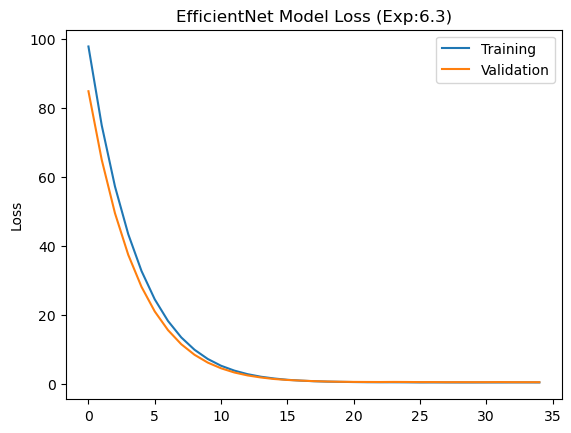

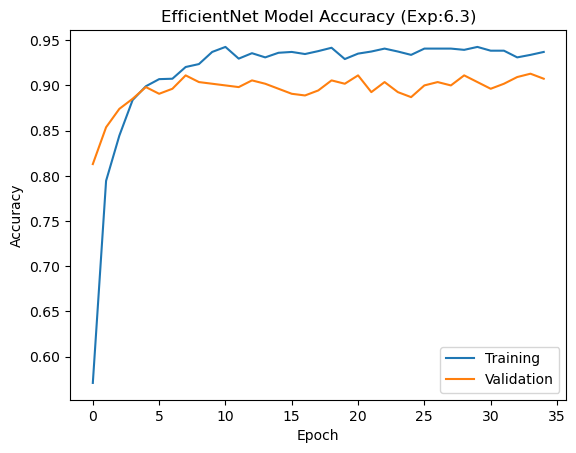

In [90]:
#Plot the training and validation loss
plt.figure()
plt.plot(history4.history['loss'], label='Training')
plt.plot(history4.history['val_loss'], label='Validation')
plt.legend(loc=0)

plt.ylabel('Loss')
plt.title('EfficientNet Model Loss (Exp:6.3)')

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history4.history['accuracy'], label='Training')
plt.plot(history4.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('EfficientNet Model Accuracy (Exp:6.3)')

In [91]:
# Evaluate the test result for EfficientNetV2
#Load the best model1 weight from checkpoint
model_EfficientNetV2.load_weights(checkpoint_filepath9)
Test_result4 = model_EfficientNetV2.evaluate(test_images1, test_labels1, batch_size = 64)

5/5 ━━━━━━━━━━━━━━━━━━━━ 54s 11s/step - accuracy: 0.9248 - loss: 0.5125


In [92]:
# Reference tf.keras.applications.EfficientNetV2 - tensorflow > API > Tensorflow v2.16.1 > Python

#Obtain the model's prediction for the test_images
prediction4 = model_EfficientNetV2.predict(test_images1)
pred_label4 = np.argmax(prediction4, axis = 1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 74s 7s/step


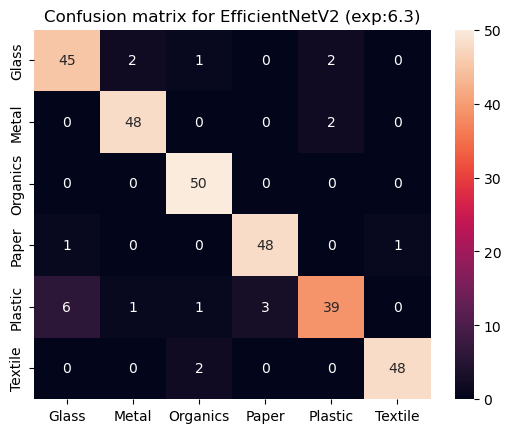

In [93]:
CM4 = confusion_matrix(test_labels1, pred_label4)
ax = plt.axes()
sns.heatmap(CM4, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix for EfficientNetV2 (exp:6.3)')
plt.show()


## Pre-Train model - MobileNetV3Large

In [94]:
#base_model_MobileNetV3Large

base_model_MobileNetV3 = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    weights='imagenet',
    input_shape=((224,224,3)),
    )

base_model_MobileNetV3.trainable = False

# Build MobileNetV3 model for waste classification

model_MobileNetV3 = tf.keras.Sequential([
    tf.keras.layers.Input((224,224,3)),
    base_model_MobileNetV3,
    tf.keras.layers.Conv2D(128, (3,3),padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    #tf.keras.layer.GlobalMaxPool2D((2,2))
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    #tf.keras.layers.Dense(1024, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(6, activation='softmax')      
])

model_MobileNetV3.summary()  

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobilenetV3large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 7, 7, 128)           │       1,106,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,251,270 (16.22 MB)

 Trainable params: 1,254,662 (4.79 MB)

 Non-trainable params: 2,996,608 (11.43 MB)

In [95]:
#Compile and fit MobileNet model

Mobile_learning_rate = 0.0002
M_epochs = 40

model_MobileNetV3.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = Mobile_learning_rate),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])


# Get the current time
start_time = datetime.now()
print('Time training start:', start_time)

history5 = model_MobileNetV3.fit(train_images1, train_labels1,
                       batch_size=batch_size, epochs= M_epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[model_checkpoint_callback10])

# Get the current time
end_time = datetime.now()
print('Time training end:', end_time)


Time training start: 2024-12-01 22:28:46.631290
Epoch 1/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3784 - loss: 142.0387
Epoch 1: val_accuracy improved from -inf to 0.79630, saving model to C:/Mani/ModelCheckpoint/model5_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.3828 - loss: 141.7784 - val_accuracy: 0.7963 - val_loss: 114.3279
Epoch 2/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 997ms/step - accuracy: 0.8149 - loss: 106.8484
Epoch 2: val_accuracy improved from 0.79630 to 0.85556, saving model to C:/Mani/ModelCheckpoint/model5_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.8155 - loss: 106.6486 - val_accuracy: 0.8556 - val_loss: 85.5777
Epoch 3/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 947ms/step - accuracy: 0.8967 - loss: 79.7166
Epoch 3: val_accuracy improved from 0.85556 to 0.87593, saving model to C:/Mani/ModelCheckpoint/model5_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.8968 - loss: 79.5633 - val_accuracy: 0.8759 - val_loss: 63.4580
Epoch 4/

Epoch 25/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 935ms/step - accuracy: 0.9916 - loss: 0.4511
Epoch 25: val_accuracy did not improve from 0.92963
34/34 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.9916 - loss: 0.4508 - val_accuracy: 0.9037 - val_loss: 0.6866
Epoch 26/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 908ms/step - accuracy: 0.9949 - loss: 0.4029
Epoch 26: val_accuracy did not improve from 0.92963
34/34 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.9947 - loss: 0.4028 - val_accuracy: 0.7759 - val_loss: 1.0981
Epoch 27/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 948ms/step - accuracy: 0.9785 - loss: 0.4309
Epoch 27: val_accuracy did not improve from 0.92963
34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9785 - loss: 0.4310 - val_accuracy: 0.8889 - val_loss: 0.8834
Epoch 28/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 887ms/step - accuracy: 0.9852 - loss: 0.4217
Epoch 28: val_accuracy did not improve from 0.92963
34/34 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.9852 - loss: 0.4214 - val_accuracy: 0.8981 - v

Text(0.5, 1.0, 'MobileNet Model Accuracy (Exp:6.3)')

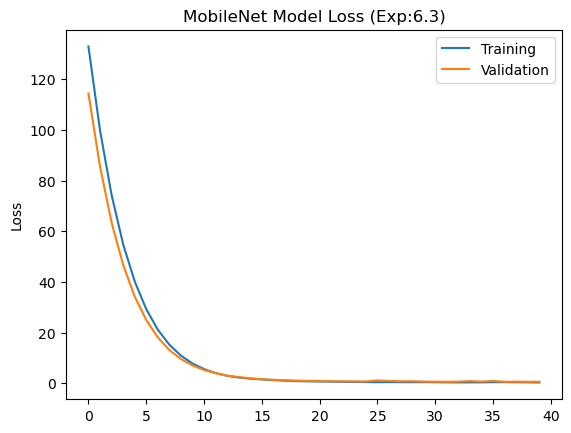

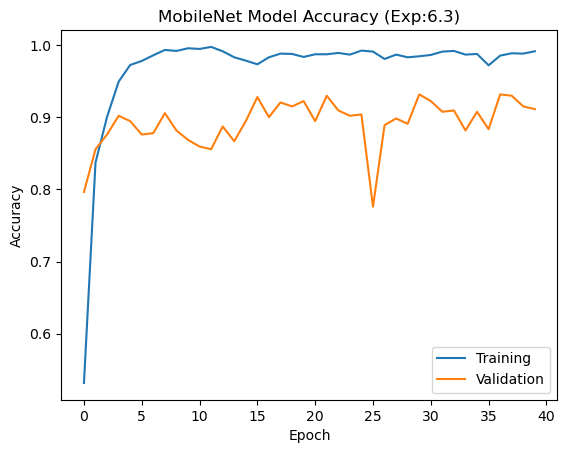

In [96]:
#Plot the training and validation loss
plt.figure()
plt.plot(history5.history['loss'], label='Training')
plt.plot(history5.history['val_loss'], label='Validation')
plt.legend(loc=0)

plt.ylabel('Loss')
plt.title('MobileNet Model Loss (Exp:6.3)')

#Plot the training and validation Accuracy
plt.figure()
plt.plot(history5.history['accuracy'], label='Training')
plt.plot(history5.history['val_accuracy'], label='Validation')
plt.legend(loc=0)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('MobileNet Model Accuracy (Exp:6.3)')

In [97]:
#Load the best model1 weight from checkpoint
model_MobileNetV3.load_weights(checkpoint_filepath10)
MobileNetV3_result = model_MobileNetV3.evaluate(test_images1, test_labels1)

print('MobileNetV3 accuracy:', MobileNetV3_result)

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 434ms/step - accuracy: 0.9257 - loss: 0.6366
MobileNetV3 accuracy: [0.6462249755859375, 0.9333333373069763]


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 543ms/step


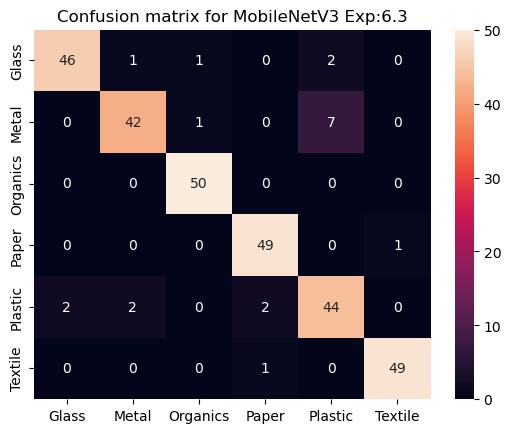

In [98]:
# Reference tf.keras.applications.MobileNetV3 - tensorflow > API > Tensorflow v2.16.1 > Python
#Load the best model weight from checkpoint
#model_MobileNetV3.load_weights(checkpoint_filepath5)

#Obtain the model's prediction for the test_images
prediction5 = model_MobileNetV3.predict(test_images1)

pred_label5 = np.argmax(prediction5, axis = 1)

CM5 = confusion_matrix(test_labels1, pred_label5)
ax = plt.axes()
sns.heatmap(CM5, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=class_names, 
           yticklabels=class_names, ax = ax)
ax.set_title('Confusion matrix for MobileNetV3 Exp:6.3')
plt.show()


In [105]:
def display_mislabel_images(class_names, images, labels):
    """
        Display mislabel images from the images array with its corresponding labels
    """
    
    fig = plt.figure(figsize=(10,10))
    fig.suptitle("mislabeled images", fontsize=16)
    for i in range(20):
        plt.subplot(5,6,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i]/255., cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[i]], fontsize = 12)
        
    plt.show()

In [100]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
        Print all the mislabeled images by the classifier
    """
    correct_label = (test_labels == pred_labels)
    mislabeled_indices = np.where(correct_label == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    actual_label = test_labels[mislabeled_indices]

      
    display_mislabel_images(class_names,  mislabeled_images, mislabeled_labels)

In [101]:
# Evaluate the test result for model 1, 2, 3
model_EfficientNetV2.load_weights(checkpoint_filepath9)
Test_result4 = model_EfficientNetV2.evaluate(test_images1, test_labels1, batch_size = 64)

model_MobileNetV3.load_weights(checkpoint_filepath10)
Test_result5 = model_MobileNetV3.evaluate(test_images1, test_labels1, batch_size = 64)

5/5 ━━━━━━━━━━━━━━━━━━━━ 52s 10s/step - accuracy: 0.9248 - loss: 0.5125
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 806ms/step - accuracy: 0.9281 - loss: 0.6311


EfficientNetV2


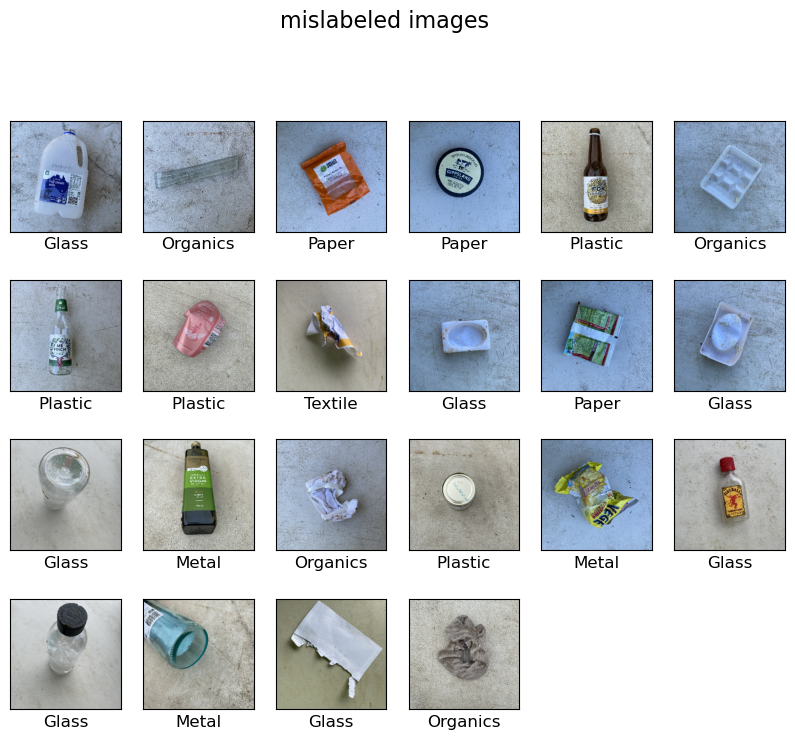

In [104]:
print('EfficientNetV2')
print_mislabeled_images(class_names, test_images1, test_labels1, pred_label4)

MobileNetV3


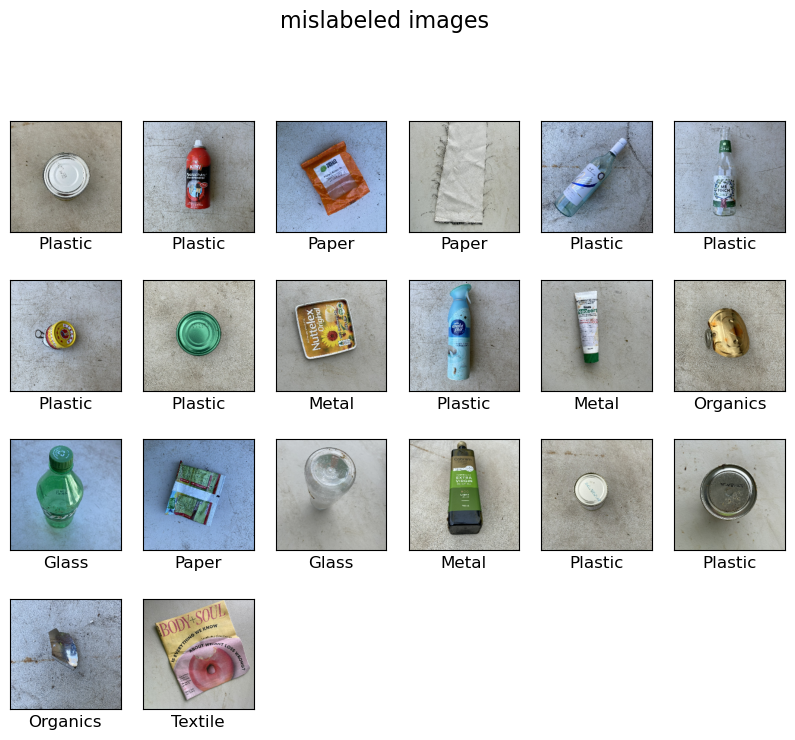

In [106]:
print('MobileNetV3')
print_mislabeled_images(class_names, test_images1, test_labels1, pred_label5)

## Predict Single images for mobileNet and EfficientNet

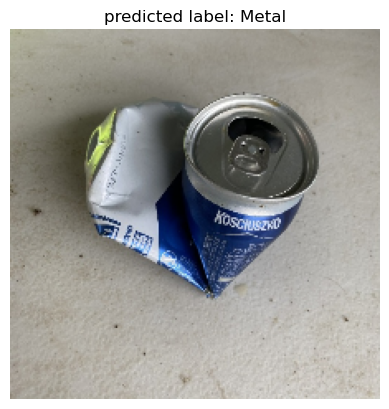

MobileNetV3 Prediction time: 0:00:00.498788


In [107]:
start_time = datetime.now()
#print('Time training start:', start_time)

IMAGE_SIZE = (224, 224)
test_image1 = cv2.imread("C:/test_ds/Metal/Metal_2.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_MobileNetV3(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
#print('Time training end:', end_time)
print('MobileNetV3 Prediction time:', end_time - start_time)

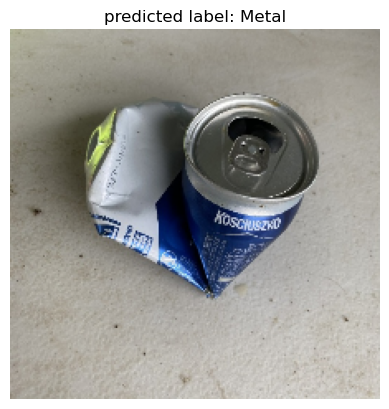

EfficientNetV2 Prediction time: 0:00:01.652368


In [108]:
start_time = datetime.now()
#print('Time training start:', start_time)

IMAGE_SIZE = (224, 224)
test_image1 = cv2.imread("C:/test_ds/Metal/Metal_2.jpg")
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_image1 = cv2.resize(test_image1, IMAGE_SIZE) 
im1= tf.constant(test_image1, dtype = tf.float32)
im1= tf.expand_dims(im1,axis = 0)
plt.title('predicted label: ' + class_names[np.argmax(model_EfficientNetV2(im1))])
plt.imshow(test_image1)
plt.grid(False)
plt.axis('off')
plt.show()

end_time = datetime.now()
#print('Time training end:', end_time)
print('EfficientNetV2 Prediction time:', end_time - start_time)